***

<font size="4">
<center>

*DBSCAN Analysis (TripAdvisor ratings)*

</font>
</center>

***

<font size="3">

<br>**Problem statement:**
<br>You have a dataset containing the ratings from travellers across East Asia. The ratings are in 10 different categories from 0 (Terrible) to 4 (Excellent). Analyse the dataset and perform DBSCAN to:
* Select the right number of dimensions
* Cluster the dataset
* Plot the clusters on a 2D/3D scatter plots
* Review the value of epsilon

</font>


*Import required modules*

In [63]:
import pandas as pd                               #Load datasets
import numpy as np
from sklearn.preprocessing import StandardScaler  #Standardization
from sklearn.decomposition import PCA             #PCA function
from sklearn.cluster import DBSCAN                #DBSCAN function
from sklearn.neighbors import NearestNeighbors    #KNN function
import matplotlib.pyplot as plt                   #Plot outputs

*Data import & cleansing*

In [64]:
#Load CSV file
Reviews_df = pd.read_csv("tripadvisor_review.csv")
Reviews_df.head()

# Remove the User ID column
Reviews_df = Reviews_df.iloc[:,1:]
Reviews_df

,Category 1,Category 2,Category 3,Category 4,Category 5,Category 6,Category 7,Category 8,Category 9,Category 10
0,0.93,1.80,2.29,0.62,0.80,2.42,3.19,2.79,1.82,2.42
1,1.02,2.20,2.66,0.64,1.42,3.18,3.21,2.63,1.86,2.32
2,1.22,0.80,0.54,0.53,0.24,1.54,3.18,2.80,1.31,2.50
3,0.45,1.80,0.29,0.57,0.46,1.52,3.18,2.96,1.57,2.86
4,0.51,1.20,1.18,0.57,1.54,2.02,3.18,2.78,1.18,2.54
...,...,...,...,...,...,...,...,...,...,...
975,0.74,1.12,0.30,0.53,0.88,1.38,3.17,2.78,0.99,3.20
976,1.25,0.92,1.12,0.38,0.78,1.68,3.18,2.79,1.34,2.80
977,0.61,1.32,0.67,0.43,1.30,1.78,3.17,2.81,1.34,3.02
978,0.93,0.20,0.13,0.43,0.30,0.40,3.18,2.98,1.12,2.46


In [65]:
len(Reviews_df)

980

*Run PCA Algorithm to get around 80% variance explained*

In [66]:
#Standardize dataframe
Reviews_Standardized_df = StandardScaler().fit_transform(Reviews_df)

#Run the PCA algorithm
pca = PCA(n_components=5)

principalComponents = pca.fit_transform(Reviews_Standardized_df)
Reviews_Standardized_df = pd.DataFrame(data = principalComponents,
                            columns = ['PC1', 'PC2', 'PC3', 'PC4', 'PC5'])

#Total variance % emplained by components
print("% variance explained by PC1 + PC2 + PC3 + PC4 + PC5:", round(((pca.explained_variance_ratio_[0] + pca.explained_variance_ratio_[1] + pca.explained_variance_ratio_[2] + pca.explained_variance_ratio_[3] + pca.explained_variance_ratio_[4])/ 1)*100,2))

% variance explained by PC1 + PC2 + PC3 + PC4 + PC5: 75.58


In [67]:
Reviews_Standardized_df

,PC1,PC2,PC3,PC4,PC5
0,2.407573,-0.073039,-0.185360,0.162400,-0.840662
1,5.311237,-0.022500,-0.654836,-0.034982,-0.225704
2,-0.807839,-1.776951,0.850661,0.750597,-0.646349
3,-1.065346,0.856401,-0.958654,0.126355,-1.201367
4,0.987246,-0.076777,-0.738679,-0.849947,0.849537
...,...,...,...,...,...
975,-2.135609,-0.786899,-0.808940,-0.207218,1.078195
976,-0.495717,-1.335973,0.811851,-0.159024,0.337611
977,-1.064439,0.458641,-0.778467,-0.698539,1.170740
978,-2.200982,-1.958907,1.424933,-0.246721,-1.708562


*Run DBSCAN Algorithm*

In [68]:
# Review the value of epsilon after KNN distance elbow plot
clustering = DBSCAN(eps=0.8, min_samples=6).fit(Reviews_Standardized_df)
DBSCAN_dataset = Reviews_Standardized_df.copy()
DBSCAN_dataset.loc[:,'Cluster'] = clustering.labels_ 

# Number of cluster created
DBSCAN_dataset['Cluster'].unique()

array([ 2, -1,  0,  1,  6,  3,  7,  5,  4], dtype=int64)

In [69]:
len(DBSCAN_dataset[DBSCAN_dataset['Cluster'] == -1])

513

*Plot the clusters along the N principal components*

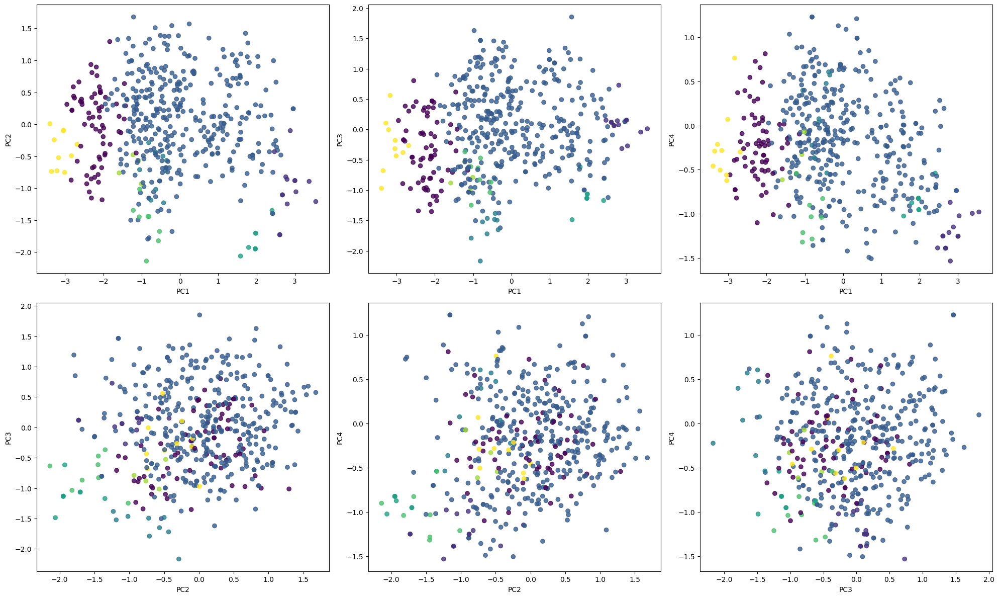

In [70]:
# Plot the non outlier  clusters
label0 = DBSCAN_dataset[DBSCAN_dataset['Cluster'] != -1]

#fig, ax = plt.subplots()
fig, ((ax1,ax2,ax3),(ax4,ax5,ax6)) = plt.subplots(2,3, figsize=(20,12))

ax1.scatter(label0['PC1'], label0['PC2'], c = label0['Cluster'], alpha=.80)
ax1.set_xlabel('PC1')
ax1.set_ylabel('PC2')

ax2.scatter(label0['PC1'], label0['PC3'], c = label0['Cluster'], alpha=.80)
ax2.set_xlabel('PC1')
ax2.set_ylabel('PC3')

ax3.scatter(label0['PC1'], label0['PC4'], c = label0['Cluster'], alpha=.80)
ax3.set_xlabel('PC1')
ax3.set_ylabel('PC4')

ax4.scatter(label0['PC2'], label0['PC3'], c = label0['Cluster'], alpha=.80)
ax4.set_xlabel('PC2')
ax4.set_ylabel('PC3')

ax5.scatter(label0['PC2'], label0['PC4'], c = label0['Cluster'], alpha=.80)
ax5.set_xlabel('PC2')
ax5.set_ylabel('PC4')

ax6.scatter(label0['PC3'], label0['PC4'], c = label0['Cluster'], alpha=.80)
ax6.set_xlabel('PC3')
ax6.set_ylabel('PC4')



    
#ax.grid(True)
fig.tight_layout()

plt.show()

In [71]:
# Browse the outlier cluster (cluster = -1)
DBSCAN_dataset[DBSCAN_dataset['Cluster'] == -1]

,PC1,PC2,PC3,PC4,PC5,Cluster
1,5.311237,-0.022500,-0.654836,-0.034982,-0.225704,-1
9,-1.532502,2.121504,-0.263840,-0.522126,0.448656,-1
10,1.289380,0.588220,1.843891,1.077743,1.908908,-1
11,-1.588713,2.076381,-1.641277,0.529934,1.192611,-1
13,1.531062,1.456531,-0.032010,-1.012194,-1.545450,-1
...,...,...,...,...,...,...
972,-0.083394,-0.524029,0.385422,3.875986,-1.394608,-1
973,0.367885,1.213490,-1.736769,-0.171169,0.139343,-1
974,3.008805,0.662020,-1.349656,-0.135449,0.988184,-1
977,-1.064439,0.458641,-0.778467,-0.698539,1.170740,-1


*Calculating the correct value for Epsilon*

In [72]:
# Calculate KNN distances
neighbors = NearestNeighbors(n_neighbors=4)
neighbors_fit = neighbors.fit(Reviews_df)
distances, indices = neighbors_fit.kneighbors(Reviews_df)

# Sort the datapoints in ascending order
distances = np.sort(distances, axis=0)
distances = distances[:,1]

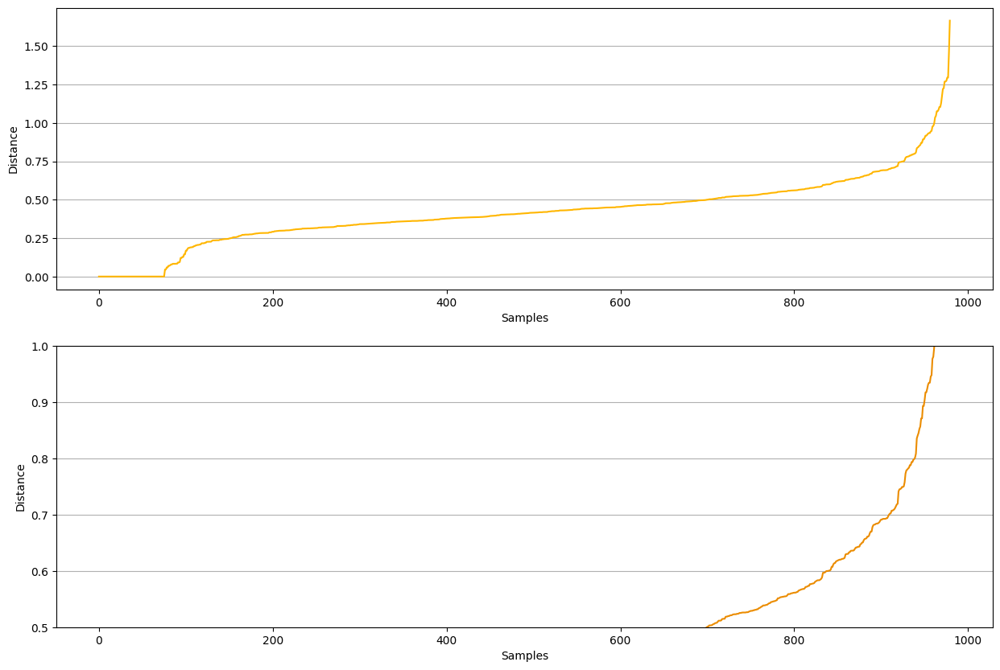

In [73]:
# Plot the points in order of ascending distances
fig, ax = plt.subplots(2, figsize = (15,10))

ax[0].plot(distances,'#FFB600')
ax[0].set_xlabel('Samples') 
ax[0].set_ylabel('Distance') 
ax[0].grid(axis='y')


ax[1].plot(distances, '#EB8C00')
ax[1].set_xlabel('Samples')
ax[1].set_ylabel('Distance')
ax[1].grid(axis='y')
ax[1].set_ylim([0.5,1])

plt.show()

In [74]:
# Join the DBScan DB with input dataframe
Reviews_df = Reviews_df.merge(DBSCAN_dataset, how = "inner", on=Reviews_df.index)
Reviews_df

,key_0,Category 1,Category 2,Category 3,Category 4,Category 5,Category 6,Category 7,Category 8,Category 9,Category 10,PC1,PC2,PC3,PC4,PC5,Cluster
0,0,0.93,1.80,2.29,0.62,0.80,2.42,3.19,2.79,1.82,2.42,2.407573,-0.073039,-0.185360,0.162400,-0.840662,2
1,1,1.02,2.20,2.66,0.64,1.42,3.18,3.21,2.63,1.86,2.32,5.311237,-0.022500,-0.654836,-0.034982,-0.225704,-1
2,2,1.22,0.80,0.54,0.53,0.24,1.54,3.18,2.80,1.31,2.50,-0.807839,-1.776951,0.850661,0.750597,-0.646349,2
3,3,0.45,1.80,0.29,0.57,0.46,1.52,3.18,2.96,1.57,2.86,-1.065346,0.856401,-0.958654,0.126355,-1.201367,2
4,4,0.51,1.20,1.18,0.57,1.54,2.02,3.18,2.78,1.18,2.54,0.987246,-0.076777,-0.738679,-0.849947,0.849537,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
975,975,0.74,1.12,0.30,0.53,0.88,1.38,3.17,2.78,0.99,3.20,-2.135609,-0.786899,-0.808940,-0.207218,1.078195,0
976,976,1.25,0.92,1.12,0.38,0.78,1.68,3.18,2.79,1.34,2.80,-0.495717,-1.335973,0.811851,-0.159024,0.337611,2
977,977,0.61,1.32,0.67,0.43,1.30,1.78,3.17,2.81,1.34,3.02,-1.064439,0.458641,-0.778467,-0.698539,1.170740,-1
978,978,0.93,0.20,0.13,0.43,0.30,0.40,3.18,2.98,1.12,2.46,-2.200982,-1.958907,1.424933,-0.246721,-1.708562,-1


In [75]:
Reviews_df.columns

Index(['key_0', 'Category 1', 'Category 2', 'Category 3', 'Category 4',
       'Category 5', 'Category 6', 'Category 7', 'Category 8', 'Category 9',
       'Category 10', 'PC1', 'PC2', 'PC3', 'PC4', 'PC5', 'Cluster'],
      dtype='object')

In [76]:
# Run a seaborn plot on the output
import seaborn as sns

Reviews_df_updated = Reviews_df[['PC1', 'PC2', 'Category 1', 'Category 2', 'Category 3', 'Category 4', 'Category 5', 'Category 6', 'Category 7', 'Category 8', 'Category 9', 'Category 10',  'Cluster']]
g = sns.PairGrid(Reviews_df_updated, hue='Cluster', height= 8)  # Create a PairGrid object with your DataFrame
g.map_diag(sns.histplot)  # Create histograms on the diagonal
g.map_offdiag(sns.scatterplot)  # Create scatter plots for off-diagonal elements
plt.show()